In [2]:
# #part1#用于将数据转换成256*256的大小，可以单独

# from PIL import Image
# import os.path
# import glob


# def convertjpg(jpgfile, outdir, width=256, height=256):
#     img = Image.open(jpgfile)
#     try:
#         new_img = img.resize((width, height), Image.BILINEAR)
#         if not os.path.exists(outdir):
#             os.mkdir(outdir)
#         new_img.save(os.path.join(outdir, os.path.basename(jpgfile)))
#     except Exception as e:
#         print(e)

# for jpgfile in glob.glob("./mao85/jiaoan/*.jpg"):#未转换的图片路径
#     convertjpg(jpgfile, "./difercat/an/")#转换后的图片的存储文件的路径

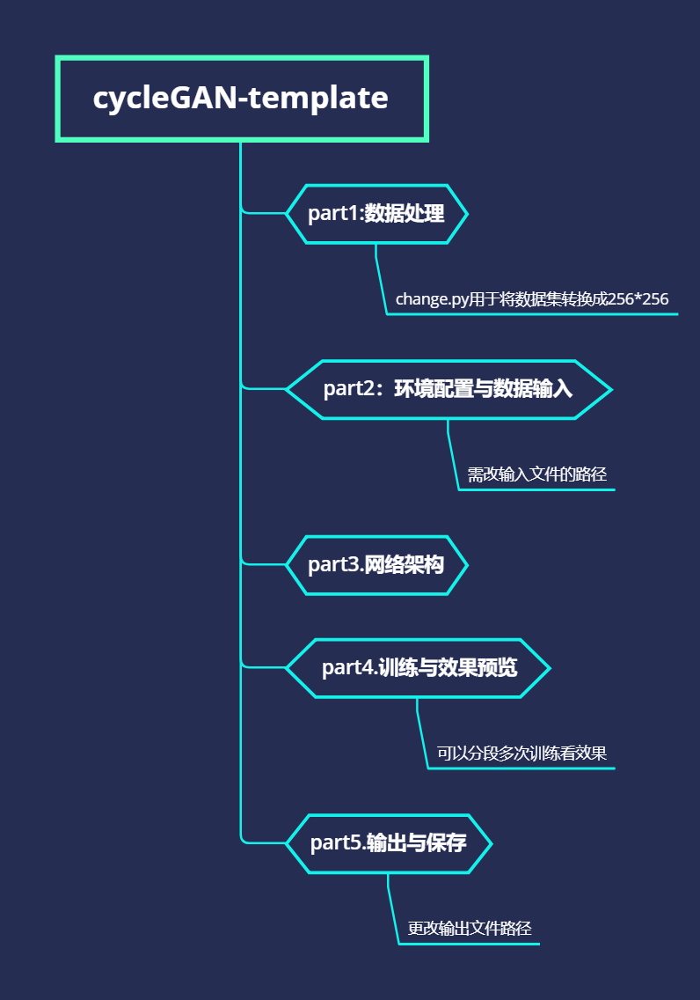

2022-11-03 11:51:28.903681: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2022-11-03 11:51:28.903923: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Device: grpc://10.0.0.2:8470


2022-11-03 11:51:36.425817: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2022-11-03 11:51:36.429260: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2022-11-03 11:51:36.429305: W tensorflow/stream_executor/cuda/cuda_driver.cc:326] failed call to cuInit: UNKNOWN ERROR (303)
2022-11-03 11:51:36.429334: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (85f2afc6028e): /proc/driver/nvidia/version does not exist
2022-11-03 11:51:36.432897: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operation

Number of replicas: 8
2.4.1


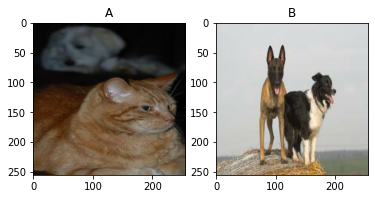

In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa
import torchvision

import os
import glob 
import matplotlib.pyplot as plt
import numpy as np
import cv2

import torch
from torch.utils import data
from PIL import Image
import numpy as np
from torchvision import transforms

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

def getFiles(root):
    img_names = os.listdir(root)
    imgs = [os.path.join(root, k) for k in img_names]
    
    IMAGE_SIZE = [256, 256]
    files = []
    for img_path in imgs:
        image_raw_data = tf.io.gfile.GFile(img_path, 'rb').read()
        image = tf.image.decode_jpeg(image_raw_data)
        image = (tf.cast(image, tf.float32) / 127.5) - 1
        image = tf.reshape(image, [*IMAGE_SIZE, 3])
        files.append(image)
    return files
# ATrainFiles = getFiles('../input/step1tostep2/Train/A/')
# BTrainFiles = getFiles('../input/step1tostep2/Train/B/')
# PredictTrain = getFiles('../input/step1tostep2/Predict/Train/')
# PredictValidation = getFiles('../input/step1tostep2/Predict/Validation/')

#输入文件目录

ATrainFiles = getFiles('../input/diferdog/diferdog/an/')
BTrainFiles = getFiles('../input/diferdog/diferdog/normal/')
# PredictTrain = getFiles('../input/diferdog/diferdog/an/')
# PredictValidation = getFiles('../input/diferdog/diferdog/normal/')

A_ds = tf.data.Dataset.from_tensor_slices(ATrainFiles).map(lambda x:x, num_parallel_calls = AUTOTUNE).batch(1)
B_ds = tf.data.Dataset.from_tensor_slices(BTrainFiles).map(lambda x:x, num_parallel_calls = AUTOTUNE).batch(1)
# T_ds = tf.data.Dataset.from_tensor_slices(PredictTrain).map(lambda x:x, num_parallel_calls = AUTOTUNE).batch(1)
# V_ds = tf.data.Dataset.from_tensor_slices(PredictValidation).map(lambda x:x, num_parallel_calls = AUTOTUNE).batch(1)

A_ds

example_A = next(iter(A_ds))
example_B = next(iter(B_ds))

plt.subplot(121)
plt.title('A')
plt.imshow(example_A[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('B')
plt.imshow(example_B[0] * 0.5 + 0.5)

In [9]:
A_ds

<BatchDataset shapes: (None, 256, 256, 3), types: tf.float32>

In [4]:
#part3网络结构
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    
    
    return tf.keras.Model(inputs=inp, outputs=last)

with strategy.scope():
    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() # differentiates real photos and generated photos
    
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }  

with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

Epoch 1/15
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.5301 - photo_gen_loss: 3.6500 - monet_disc_loss: 0.5215 - photo_disc_loss: 0.5359
Epoch 2/15
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.5184 - photo_gen_loss: 3.6109 - monet_disc_loss: 0.5301 - photo_disc_loss: 0.5529
Epoch 3/15
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.4892 - photo_gen_loss: 3.5413 - monet_disc_loss: 0.5350 - photo_disc_loss: 0.5681
Epoch 4/15
99/99 [==============================] - 12s 125ms/step - monet_gen_loss: 3.4846 - photo_gen_loss: 3.5206 - monet_disc_loss: 0.5437 - photo_disc_loss: 0.5743
Epoch 5/15
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.4631 - photo_gen_loss: 3.4592 - monet_disc_loss: 0.5455 - photo_disc_loss: 0.5792
Epoch 6/15
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.4442 - photo_gen_loss: 3.3628 - monet_disc_loss: 0.5560 - photo_disc

2022-11-03 12:02:43.826167: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 71529, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1667476963.826091729","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 71529, Output num: 0","grpc_status":3}


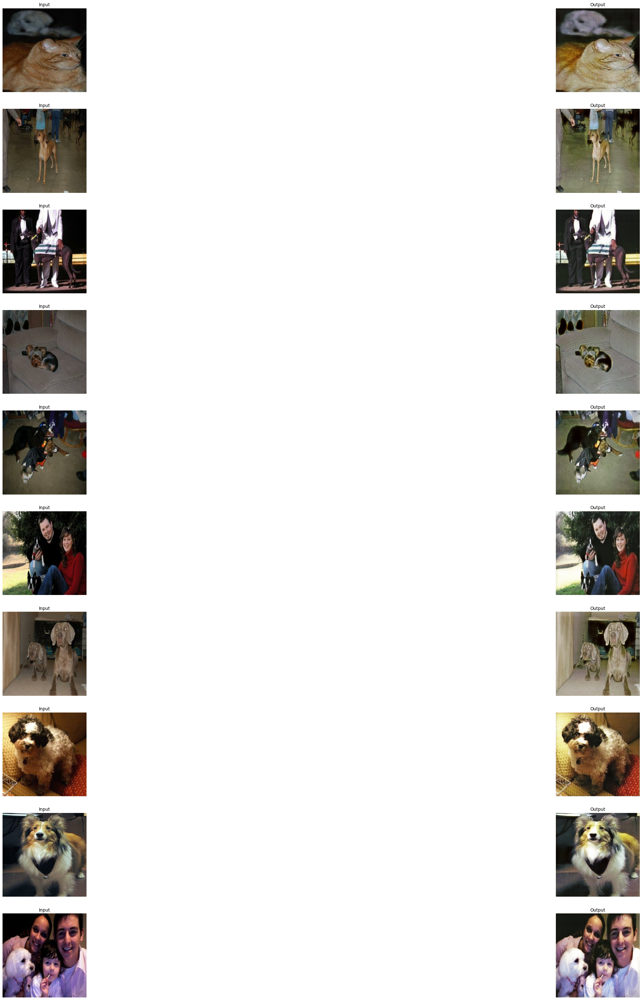

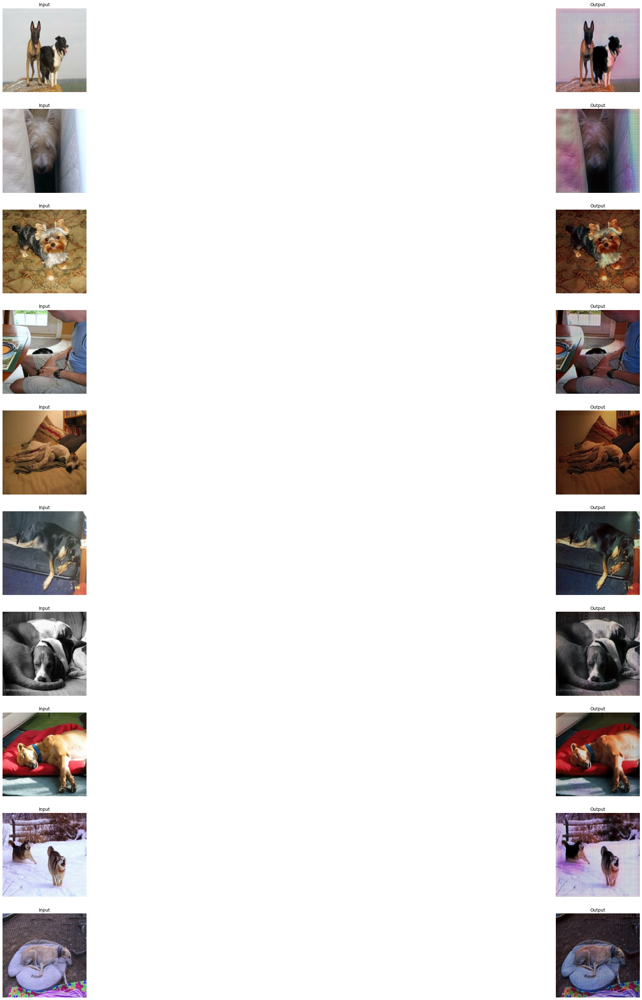

In [8]:
#part4训练与预览

#Train 建议多复制几份分别来看效果
cycle_gan_model.fit(
    tf.data.Dataset.zip((B_ds, A_ds)),
    epochs = 15
)
_, ax = plt.subplots(10, 2, figsize=(50,50))
for i, img in enumerate(A_ds.take(10)):
    prediction_A = monet_generator(img, training=False)[0].numpy()
    prediction_A= (prediction_A* 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction_A)
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Output")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()
_, ax = plt.subplots(10, 2, figsize=(50,50))
for i, img in enumerate(B_ds.take(10)):
    prediction_B = photo_generator(img, training=False)[0].numpy()
    prediction_B= (prediction_B* 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction_B)
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Output")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()

Epoch 1/10
99/99 [==============================] - 12s 125ms/step - monet_gen_loss: 3.0791 - photo_gen_loss: 2.8469 - monet_disc_loss: 0.5958 - photo_disc_loss: 0.6143
Epoch 2/10
99/99 [==============================] - 12s 125ms/step - monet_gen_loss: 3.0380 - photo_gen_loss: 2.8041 - monet_disc_loss: 0.5990 - photo_disc_loss: 0.6166
Epoch 3/10
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.0647 - photo_gen_loss: 2.7961 - monet_disc_loss: 0.6001 - photo_disc_loss: 0.6216
Epoch 4/10
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 3.0760 - photo_gen_loss: 2.8308 - monet_disc_loss: 0.6004 - photo_disc_loss: 0.6213
Epoch 5/10
99/99 [==============================] - 12s 125ms/step - monet_gen_loss: 3.0273 - photo_gen_loss: 2.7661 - monet_disc_loss: 0.6021 - photo_disc_loss: 0.6236
Epoch 6/10
99/99 [==============================] - 12s 126ms/step - monet_gen_loss: 2.9409 - photo_gen_loss: 2.6840 - monet_disc_loss: 0.6015 - photo_disc

2022-11-03 12:07:39.588207: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 121383, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1667477259.588102724","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 121383, Output num: 0","grpc_status":3}


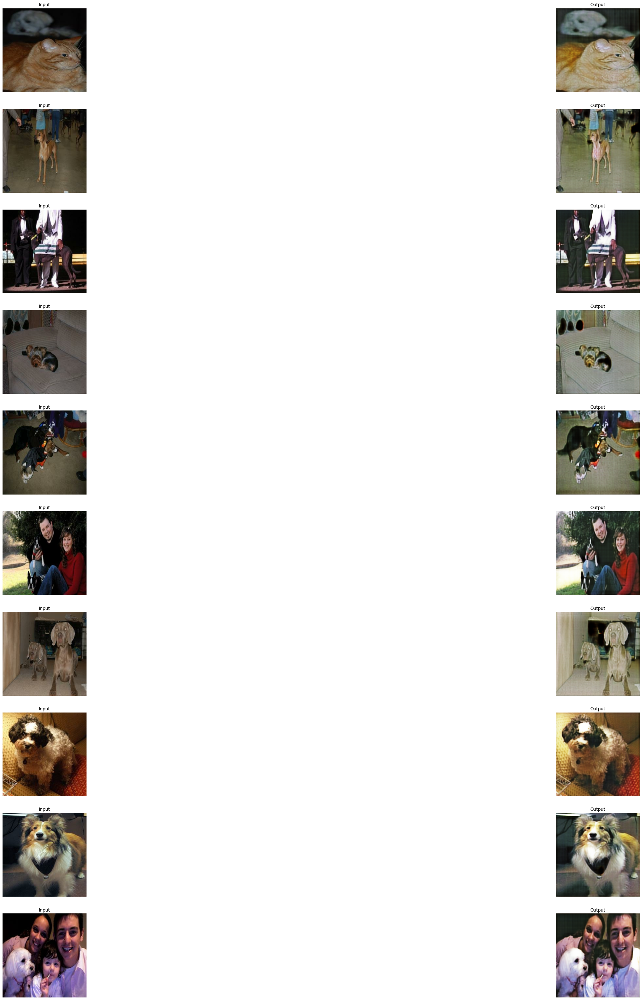

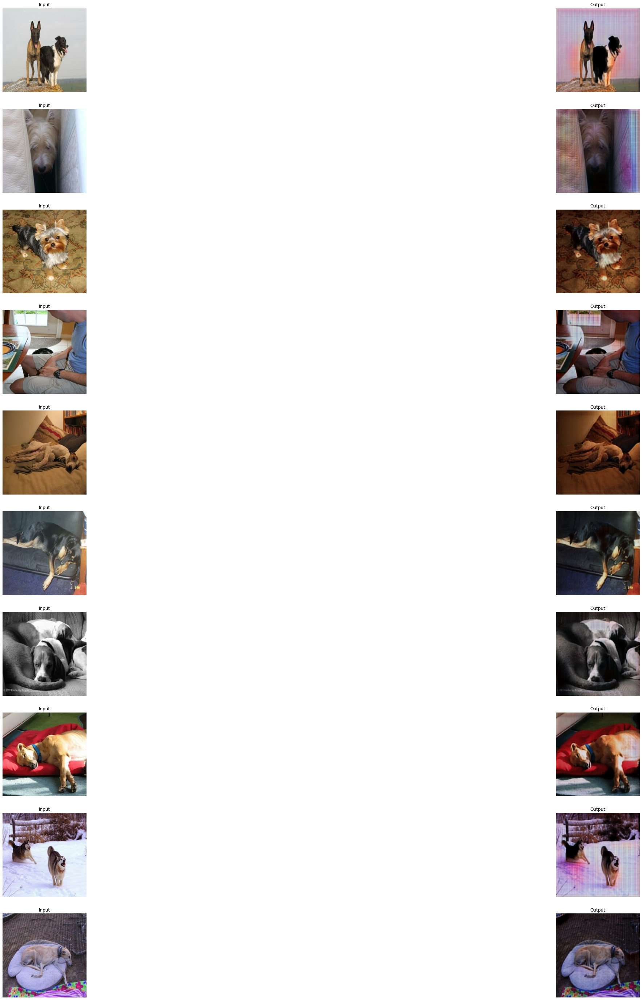

In [12]:
#再来查看一遍
cycle_gan_model.fit(
    tf.data.Dataset.zip((B_ds, A_ds)),
    epochs = 10
)
#
_, ax = plt.subplots(10, 2, figsize=(50,50))
for i, img in enumerate(A_ds.take(10)):
    prediction_A = monet_generator(img, training=False)[0].numpy()
    prediction_A= (prediction_A* 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction_A)
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Output")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()
_, ax = plt.subplots(10, 2, figsize=(50,50))
for i, img in enumerate(B_ds.take(10)):
    prediction_B = photo_generator(img, training=False)[0].numpy()
    prediction_B= (prediction_B* 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction_B)
    ax[i, 0].set_title("Input")
    ax[i, 1].set_title("Output")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()


In [ ]:
##用于删除杂项文件

# import os #引入库
# import shutil #引入库
# def CleanDir( Dir ): #声明一个叫cleandir的函数，函数的参数是dir
#     if os.path.isdir( Dir ): #os.path.isdir()函数判断dir是否是一个目录，同理os.path.isfile()函数判断是否是一个文件。
#         paths = os.listdir( Dir )#os.listdir() 方法用于返回指定的文件夹包含的文件或文件夹的名字的列表。
#         for path in paths:
#             filePath = os.path.join( Dir, path )#os.path.join()方法是，拼接参数里的路径，
#             if os.path.isfile( filePath ):#见第8行
#                 try:
#                     os.remove( filePath )#删除
#                 except os.error:#后边这些都看不懂喽
#                     autoRun.exception( "remove %s error." %filePath )#引入logging
#             elif os.path.isdir( filePath ):
#                 if filePath[-4:].lower() == ".svn".lower():
#                     continue
#                 shutil.rmtree(filePath,True)
#     return True
# Dir = r'/kaggle/working/prediction/A->B/'#这是设定的是文件夹路径，上面的东西不用管，只在这改成要删除文件的文件夹路径就行了。
# CleanDir(Dir)
# os.rmdir(Dir)

In [14]:
#最后进行保存文件。
import PIL

os.mkdir('./prediction')
os.mkdir('./prediction/A-B')
os.mkdir('./prediction/B-A')

def predict_A(root, ds, save):
    
    img_names = os.listdir(root)
    i = 0
    for img in ds:
        prediction = monet_generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        im = PIL.Image.fromarray(prediction)
        im.save(save + img_names[i])
        i += 1
        
predict_A('../input/diferdog/diferdog/an', A_ds, './prediction/A-B/')

def predict_B(root, ds, save):       
    img_names = os.listdir(root)
    i = 0
    for img in ds:
        prediction = photo_generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        im = PIL.Image.fromarray(prediction)
        im.save(save + img_names[i])
        i += 1

predict_B('../input/diferdog/diferdog/normal', B_ds, './prediction/B-A/')


2022-11-03 12:09:16.310131: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 192322, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task:0:
:{"created":"@1667477356.310049544","description":"Error received from peer ipv4:10.0.0.2:8470","file":"external/com_github_grpc_grpc/src/core/lib/surface/call.cc","file_line":1056,"grpc_message":"Unable to find the relevant tensor remote_handle: Op ID: 192322, Output num: 0","grpc_status":3}
2022-11-03 12:10:54.382916: W ./tensorflow/core/distributed_runtime/eager/destroy_tensor_handle_node.h:57] Ignoring an error encountered when deleting remote tensors handles: Invalid argument: Unable to find the relevant tensor remote_handle: Op ID: 407481, Output num: 0
Additional GRPC error information from remote target /job:worker/replica:0/task

In [15]:
#下载zip压缩包到本地
import os
import zipfile
import datetime

def file2zip(packagePath, zipPath):
    '''
  :param packagePath: 文件夹路径
  :param zipPath: 压缩包路径
  :return:
  '''
    zip = zipfile.ZipFile(zipPath, 'w', zipfile.ZIP_DEFLATED)
    for path, dirNames, fileNames in os.walk(packagePath):
        fpath = path.replace(packagePath, '')
        for name in fileNames:
            fullName = os.path.join(path, name)
            name = fpath + '\\' + name
            zip.write(fullName, name)
    zip.close()


if __name__ == "__main__":
    # 文件夹路径
    packagePath = '/kaggle/working/'
    zipPath = '/kaggle/working/output.zip'
    if os.path.exists(zipPath):
        os.remove(zipPath)
    file2zip(packagePath, zipPath)
    print("打包完成")
    print(datetime.datetime.utcnow())


打包完成
2022-11-03 12:10:54.597111
